In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import scanpy as sc,anndata as ad
import os
import sys
import scipy as sp
from scipy.sparse import vstack,csr_matrix,bsr_matrix,coo_matrix,issparse
from scipy.sparse.linalg import inv
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,scale
from scipy.spatial import distance_matrix, distance, KDTree
from scipy.spatial.distance import cdist
import networkx as nx
from sklearn.neighbors import NearestNeighbors,BallTree
from tqdm import tqdm
import time
import rdata
import igraph as ig
import glasbey
import warnings
import cairocffi as cairo
from sklearn.metrics import adjusted_rand_score,make_scorer
from sklearn.model_selection import GridSearchCV, ParameterGrid
from mclustpy import mclustpy
from sklearn.cluster import KMeans
import SEDR
from matplotlib.colors import ListedColormap
from multiprocessing import Pool

from esda import Moran
from libpysal.weights import KNN
import squidpy as sq

/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
import spatialdata_plot

In [3]:
import spatialdata as sd

In [4]:
import spatialdata_io

/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
#combine csv files first: 
import glob as glob
def combine_csv_files_by_fraction(input_dir, output_dir):
    # Ensure the output directory exists
    #os.makedirs(output_dir, exist_ok=True)
    
    # Get a list of all CSV files following the naming convention
    csv_files = glob.glob(os.path.join(input_dir, 'index_seed_*.csv'))
    
    # A dictionary to store DataFrames grouped by the fraction value
    fraction_file_dict = {}
    
    # Process each file
    for file_path in csv_files:
        # Extract the fraction from the file name
        file_name = os.path.basename(file_path)
        split_name = file_name.split('_')
        # Convert from string to float
        fraction = float(split_name[-1].replace('.csv', ''))
        
        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)
        
        # Group by the fraction
        if fraction not in fraction_file_dict:
            fraction_file_dict[fraction] = [df]
        else:
            fraction_file_dict[fraction].append(df)
    
    # Write out the concatenated files by fraction
    for fraction, dfs in fraction_file_dict.items():
        # Concatenate all DataFrames for this fraction
        combined_df = pd.concat(dfs, ignore_index=False,axis=1)
        
        # Define the output file name
        output_file_name = f'index_{fraction:.2f}.csv'
        output_file_path = os.path.join(output_dir, output_file_name)
        
        # Save to a CSV file
        combined_df.to_csv(output_file_path, index=False)

In [5]:
df = pd.read_parquet("/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/raw_data/binned_outputs/square_008um/spatial/tissue_positions.parquet")


In [6]:
df.to_csv("/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/raw_data/binned_outputs/square_008um/spatial/tissue_positions_list.csv")

In [7]:
sdata = spatialdata_io.visium_hd("/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/raw_data")

/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/scratch/f006z2w/ipykernel_1779450/2350039622.py:1: UserWarning: No full resolution image found. If incorrect, please specify the path in the `fullres_image_file` parameter when calling the 

In [8]:
# let's make the var names unique; this improves performance in accessing the tabular data and is necessary to be able to plot the data
for table in sdata.tables.values():
    table.var_names_make_unique()

In [9]:
sdata

SpatialData object
├── Images
│     ├── 'Visium_HD_Mouse_Brain_hires_image': DataArray[cyx] (3, 6000, 4729)
│     └── 'Visium_HD_Mouse_Brain_lowres_image': DataArray[cyx] (3, 600, 473)
├── Shapes
│     ├── 'Visium_HD_Mouse_Brain_square_002um': GeoDataFrame shape: (6296688, 1) (2D shapes)
│     ├── 'Visium_HD_Mouse_Brain_square_008um': GeoDataFrame shape: (393543, 1) (2D shapes)
│     └── 'Visium_HD_Mouse_Brain_square_016um': GeoDataFrame shape: (98917, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (6296688, 19059)
      ├── 'square_008um': AnnData (393543, 19059)
      └── 'square_016um': AnnData (98917, 19059)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        Visium_HD_Mouse_Brain_hires_image (Images), Visium_HD_Mouse_Brain_square_002um (Shapes), Visium_HD_Mouse_Brain_square_008um (Shapes), Visium_HD_Mouse_Brain_square_016um (Shapes)
    ▸ 'downscaled_lowres', with elements:
        Visium_HD_Mouse_Brain_lowres_image (Images), Visium_HD_Mouse_Brai

INFO     Dropping coordinate system 'downscaled_lowres' since it doesn't have relevant elements.                   
INFO     Rasterizing image for faster rendering.                                                                   


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


INFO     Rasterizing image for faster rendering.                                                                   


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


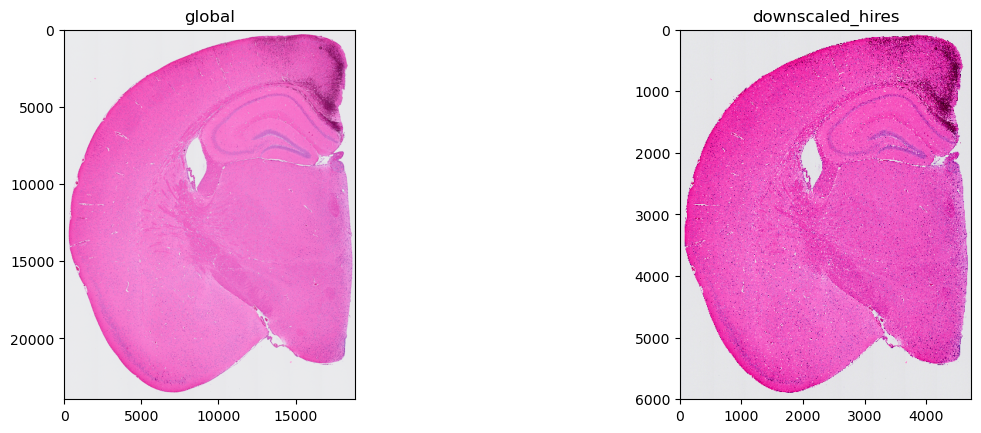

In [10]:
import spatialdata_plot


sdata.pl.render_images("Visium_HD_Mouse_Brain_hires_image").pl.show()
#sdata.pl.render_images("Visium_HD_Mouse_Brain_lowres_image").pl.show(ax=axes[1], title="CytAssit image")

/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Mouse_Brain_square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


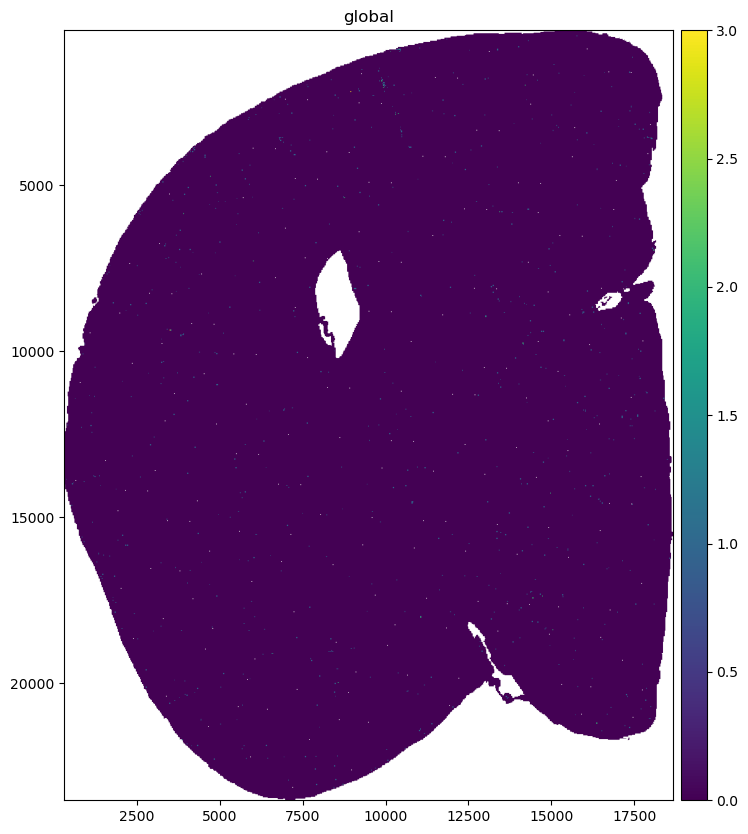

In [53]:
#lets try to visulize Sema3e at the 8um bin 

plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name = "Sox17"
sdata.pl.render_shapes("Visium_HD_Mouse_Brain_square_008um", color=gene_name, method="datashader").pl.show(
    coordinate_systems="global", ax=ax
)


/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


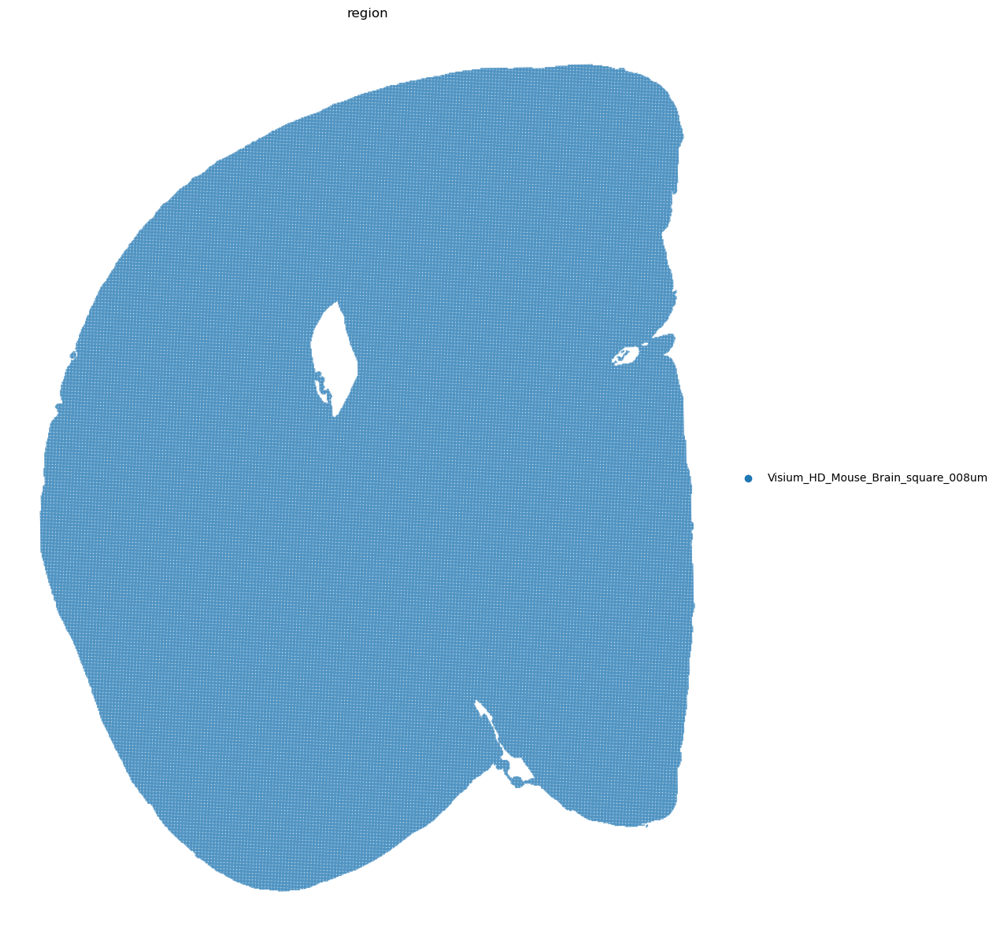

In [32]:
fig, ax = plt.subplots(figsize=(15, 15))
sq.pl.spatial_scatter(sdata.tables['square_008um'],color = 'region', size=.1, vmax=1, cmap='magma',frameon=False,
        shape=None,ax =ax)

In [23]:
adata=sdata.tables['square_008um'].copy()
adata.var_names_make_unique()

In [24]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("Mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [25]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)


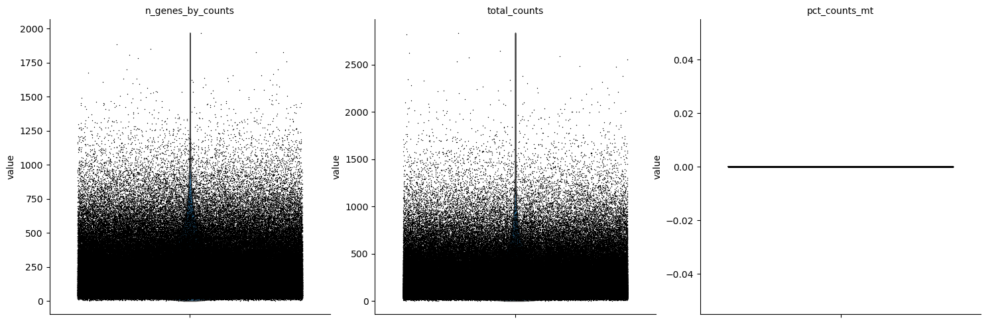

In [14]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [26]:
sc.pp.filter_cells(adata, min_genes=10)
#sc.pp.filter_genes(adata, min_cells=3)

In [27]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
#sc.pp.pca(adata)
#use only 20 PCs and used the randomized version: 
pca_model = PCA(n_components=20, svd_solver='randomized', random_state=2024)
pca_data = pca_model.fit_transform(adata.X.toarray())
adata.obsm['X_pca'] = pca_data
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)
sc.tl.louvain(adata)


2025-05-01 10:13:25.324118: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-01 10:13:28.177031: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-01 10:13:29.135081: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-01 10:13:34.495224: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-01 10:14:15.262363: W tensorflow/compiler/tf2

In [28]:
#compute the 5000 most highly variable so that we are usign same number of features as the 
#xenium assays 
sc.pp.highly_variable_genes(adata, n_top_genes=5000)

In [29]:
adata

AnnData object with n_obs × n_vars = 393434 × 19059
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', 'louvain'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatialdata_attrs', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'louvain', 'hvg'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'co

/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


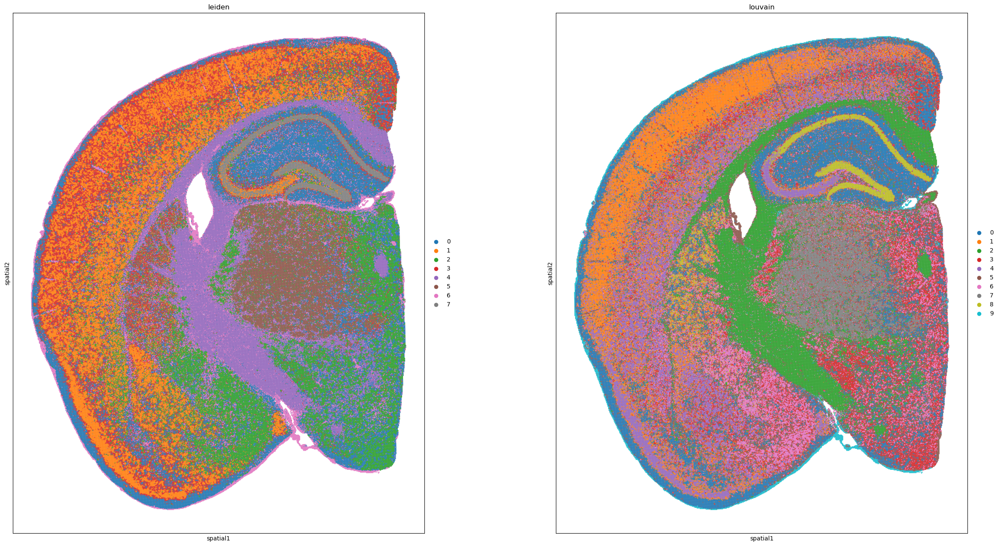

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(30, 30))  # Create subplots for two colors

sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["leiden", "louvain"],
    wspace=0.4,
    fig=fig,  # Explicitly pass the figure object
    ax=axes   # Pass list of axes
)

plt.show()

In [7]:
import scanpy as sc
from sklearn.decomposition import PCA
import joblib 

In [2]:
import os
directory = "/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/processed_data"
adata = sc.read_h5ad(os.path.join(directory,"processed_data_8um.h5ad"))
#np.shape(adata.obsm['X_pca'])

In [5]:
#read in the hvg version only and then do the PCA reduction: 
directory = "/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/processed_data"
adata = sc.read_h5ad(os.path.join(directory,"processed_data_8um_hvg.h5ad"))


In [6]:
X_full = adata.X.toarray()

full_pca = PCA(n_components=20,
               svd_solver='randomized',
               random_state=2024)
full_pca.fit(X_full)

PCA(n_components=20, random_state=2024, svd_solver='randomized')

In [8]:
joblib.dump(full_pca, '/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/processed_data/full_pca_20comps.joblib')

['/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/processed_data/full_pca_20comps.joblib']

In [31]:
#save the adata at the 8um binning as a .h5ad file! 
adata.write_h5ad("/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/processed_data/processed_data_8um.h5ad")


In [22]:
#save the counts only version as well: 
import anndata as ad
adata_counts_only = ad.AnnData(X = adata.X.copy())
adata_counts_only.write_h5ad("/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/processed_data/counts_only_8um.h5ad")


In [6]:
#we need to save all the files to combined dir (index files): 
parent_dir = '/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/public_data/visium_HD_brain/sketching_test/index'

input_dir = os.path.join(parent_dir,'uniform_index/archive')
output_dir = os.path.join(parent_dir,'uniform_index')

combine_csv_files_by_fraction(input_dir, output_dir)

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
sq.pl.spatial_scatter(adata,color = 'total_counts', size=.1, cmap='magma_r',frameon=False,
        shape=None,ax =ax)

In [20]:
#Ok, lets try to run the CCI on this now. 
import decoupler as dc
import plotnine as p9
import liana as li

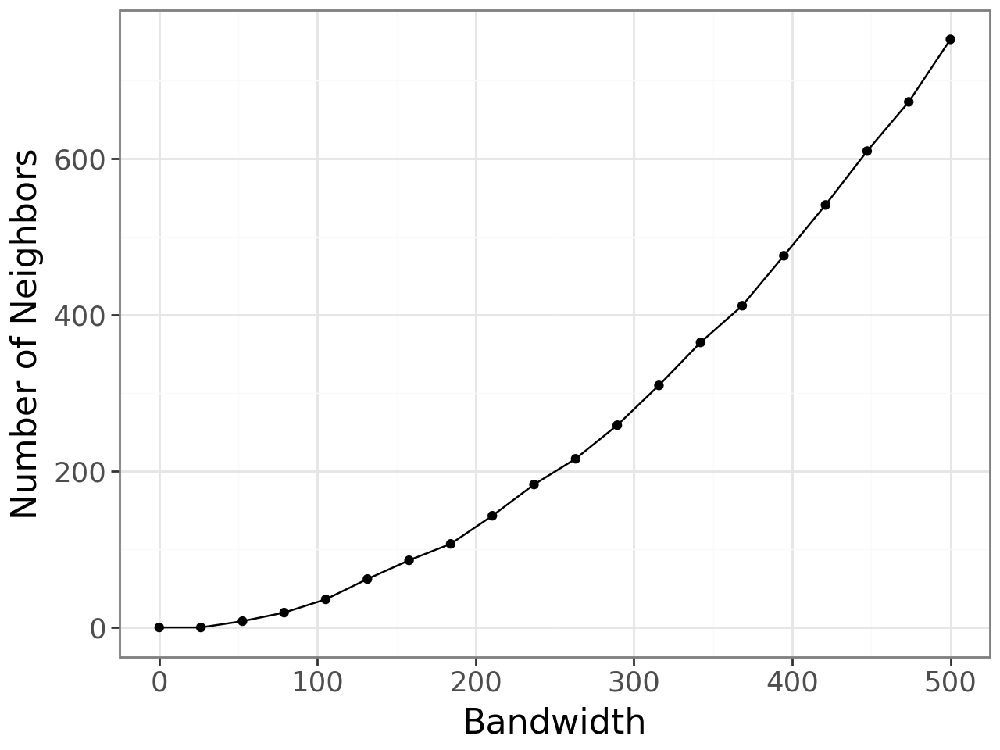

In [81]:
plot, _ = li.ut.query_bandwidth(coordinates=adata.obsm['spatial'], start=0, end=500, interval_n=20)
plot

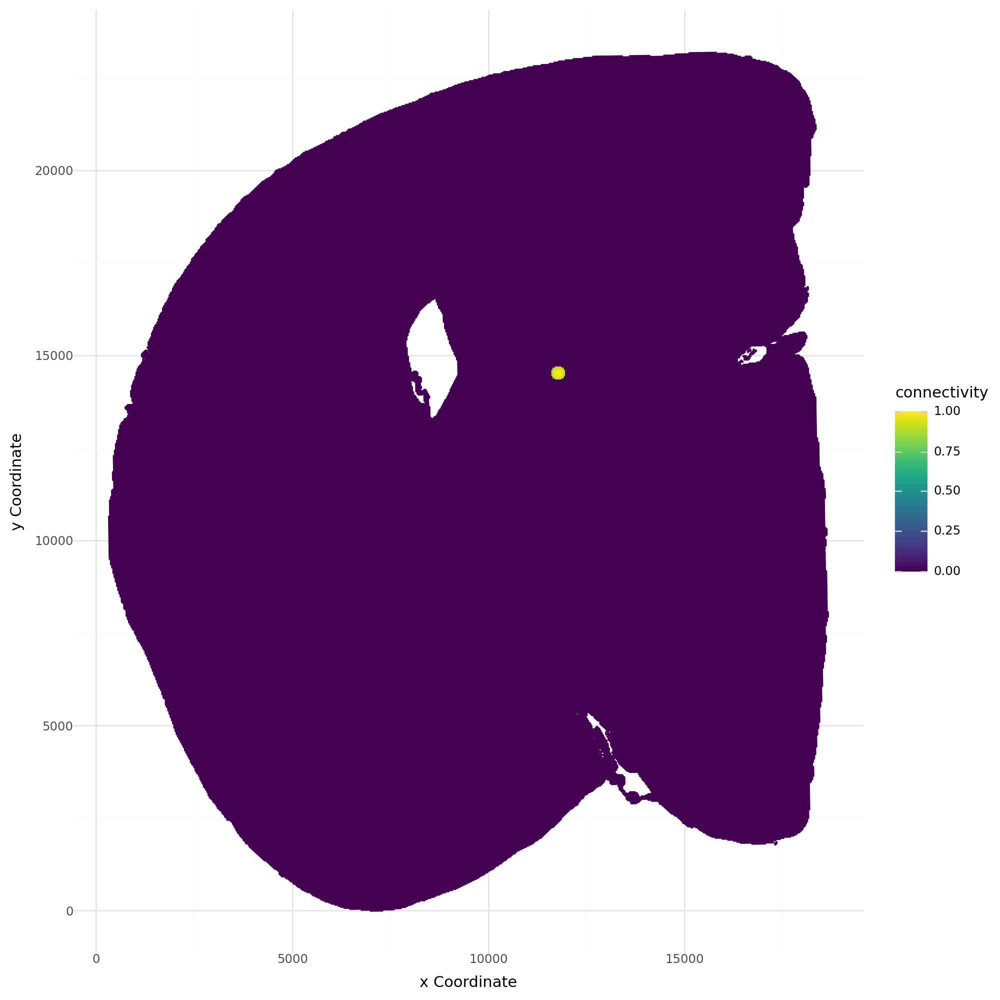

In [21]:
li.ut.spatial_neighbors(adata, bandwidth=300, cutoff=0.1, kernel='gaussian', set_diag=True)
li.pl.connectivity(adata, idx=0, size=0.001, figure_size=(10, 10))

In [22]:
lrdata = li.mt.bivariate(adata,
                resource_name='mouseconsensus', # NOTE: choose the appropriate resource. Run li.rs.show_resources()  to see options !
                local_name='cosine', # Name of the function
                global_name="morans", # Name global function
                n_perms=100, # Number of permutations to calculate a p-value
                mask_negatives=False, # Whether to mask LowLow/NegativeNegative interactions
                add_categories=True, # Whether to add local categories to the results
                nz_prop=0.05, # Minimum expr. proportion for ligands/receptors and their subunits
                use_raw=False,
                verbose=True
                )

Using `.X`!
/dartfs-hpc/rc/lab/F/FrostH/members/igingerich/envs/miniconda3/envs/r-kernel/lib/python3.12/site-packages/anndata/_core/anndata.py:401: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
68 features of mat are empty, they will be removed.
Using resource `mouseconsensus`.
100%|███████████████████████████████████████████████████████████████████████| 100/100 [03:19<00:00,  1.99s/it]


In [23]:
lrdata.var.sort_values("mean", ascending=False).head(10)

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
App^Aplp1,App,Aplp1,0.300002,0.422467,0.098943,0.172875,0.013142,0.0,0.243435,0.133359
App^Lrp1,App,Lrp1,0.300002,0.422467,0.054186,0.105199,0.004116,0.0,0.177754,0.119452
App^Aplp2,App,Aplp2,0.300002,0.422467,0.042603,0.084304,0.011193,0.0,0.173780,0.113517
Apoe^Lrp1,Apoe,Lrp1,0.321309,0.364430,0.054186,0.105199,0.005143,0.0,0.160042,0.107286
Rtn4^Lingo1,Rtn4,Lingo1,0.107040,0.198641,0.036202,0.080979,0.027121,0.0,0.111337,0.124730
Sptan1^Ptpra,Sptan1,Ptpra,0.067963,0.136150,0.051036,0.100355,0.004787,0.0,0.098905,0.111229
Lrrc4b^Ptprs,Lrrc4b,Ptprs,0.034705,0.071796,0.062479,0.130962,0.006541,0.0,0.085808,0.106808
Rims1^Slc17a7,Rims1,Slc17a7,0.040077,0.078186,0.072327,0.139416,0.037558,0.0,0.081515,0.113795
Agrn^Atp1a3,Agrn,Atp1a3,0.023583,0.052964,0.089353,0.170415,0.003669,0.0,0.079579,0.099767


In [25]:
lrdata.var

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
App^Aplp1,App,Aplp1,0.300002,0.422467,0.098943,0.172875,0.013142,0.0,0.243435,0.133359
App^Aplp2,App,Aplp2,0.300002,0.422467,0.042603,0.084304,0.011193,0.0,0.173780,0.113517
App^Lrp1,App,Lrp1,0.300002,0.422467,0.054186,0.105199,0.004116,0.0,0.177754,0.119452
Sirpa^Cd47,Sirpa,Cd47,0.037606,0.080468,0.034274,0.071511,0.003983,0.0,0.067679,0.104844
Cd47^Sirpa,Cd47,Sirpa,0.034274,0.071511,0.037606,0.080468,0.004015,0.0,0.067679,0.104844
Cntn1^Nrcam,Cntn1,Nrcam,0.026640,0.055438,0.024842,0.055280,0.004844,0.0,0.046737,0.096677
Lrrc4b^Ptprs,Lrrc4b,Ptprs,0.034705,0.071796,0.062479,0.130962,0.006541,0.0,0.085808,0.106808
Agrn^Lrp1,Agrn,Lrp1,0.023583,0.052964,0.054186,0.105199,0.004451,0.0,0.066127,0.100229
Apoe^Lrp1,Apoe,Lrp1,0.321309,0.364430,0.054186,0.105199,0.005143,0.0,0.160042,0.107286


... storing 'ligand' as categorical
... storing 'receptor' as categorical


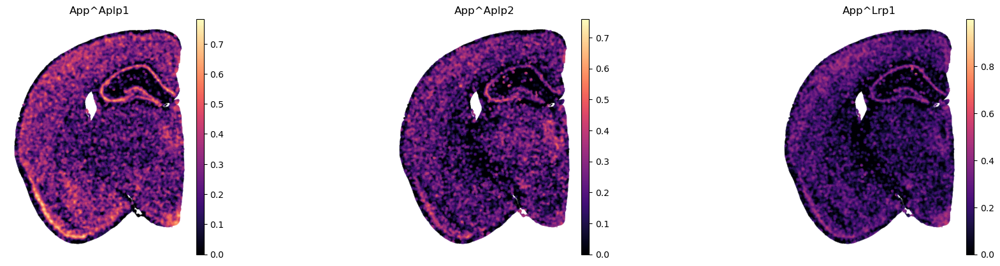

In [121]:
#fig, ax = plt.subplots(figsize=(15, 15))
sq.pl.spatial_scatter(lrdata,color=["App^Aplp1","App^Aplp2","App^Lrp1"], size=.01, cmap='magma',frameon=False,
        shape=None,)

/scratch/f006z2w/ipykernel_2115088/1224992501.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.


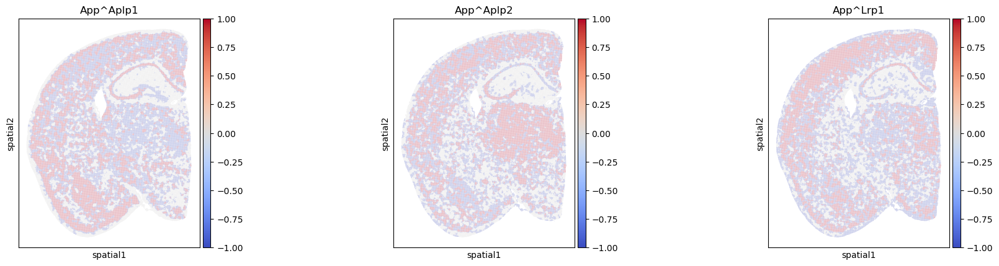

In [122]:
sc.pl.spatial(lrdata, layer='cats', color=["App^Aplp1","App^Aplp2","App^Lrp1"], size=15, cmap="coolwarm",spot_size=1)

In [1]:
lrdata.var

NameError: name 'lrdata' is not defined

In [26]:
adata

AnnData object with n_obs × n_vars = 393434 × 19059
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatialdata_attrs', 'log1p', 'hvg'
    obsm: 'spatial'
    layers: 'counts'
    obsp: 'spatial_connectivities'